<h2>Importing Necessary Libraries and Modules</h2>

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt
import imageio
from PIL import Image
import numpy as np

Neural Style Transform
we would have one content image, one art image and we need to generate an image which would combine both image and provide us with content image in artistic style.

--Transfer Learning

In [ ]:
img_size=224

In [ ]:
model = tf.keras.applications.VGG19(include_top=False,weights='imagenet',input_shape=(img_size,img_size,3))
model.trainable=False

In [ ]:
model.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

First conent cost funtion then style cost funtion and combine it.

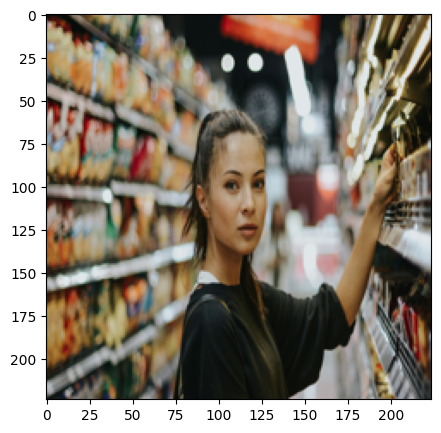

In [ ]:
content_img = np.array(Image.open('/content/joshua-rawson-harris-YNaSz-E7Qss-unsplash.jpg').resize((img_size,img_size)).convert('RGB'))
content_img = tf.constant(np.reshape(content_img,(1,)+content_img.shape),dtype=tf.float32)
content_img = content_img/255.0
plt.figure(figsize=(5,5))
plt.imshow(content_img[0])

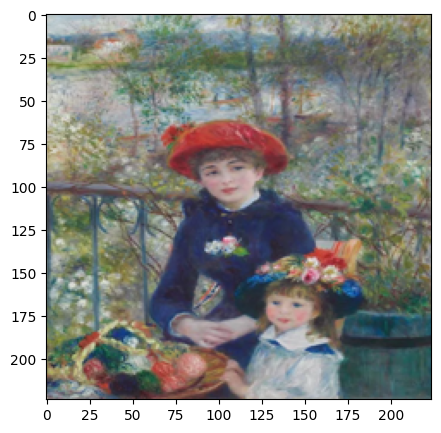

In [ ]:
style_img= np.array(Image.open('/content/Screenshot 2025-05-14 095653.png').resize((img_size,img_size)).convert('RGB'))
style_img = tf.constant(np.reshape(style_img,(1,)+style_img.shape),dtype=tf.float32)
style_img = style_img/255.0
plt.figure(figsize=(5,5))
plt.imshow(style_img[0])

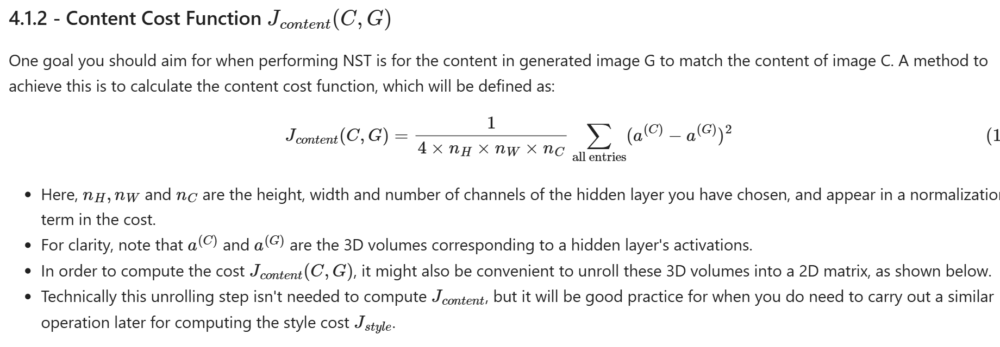

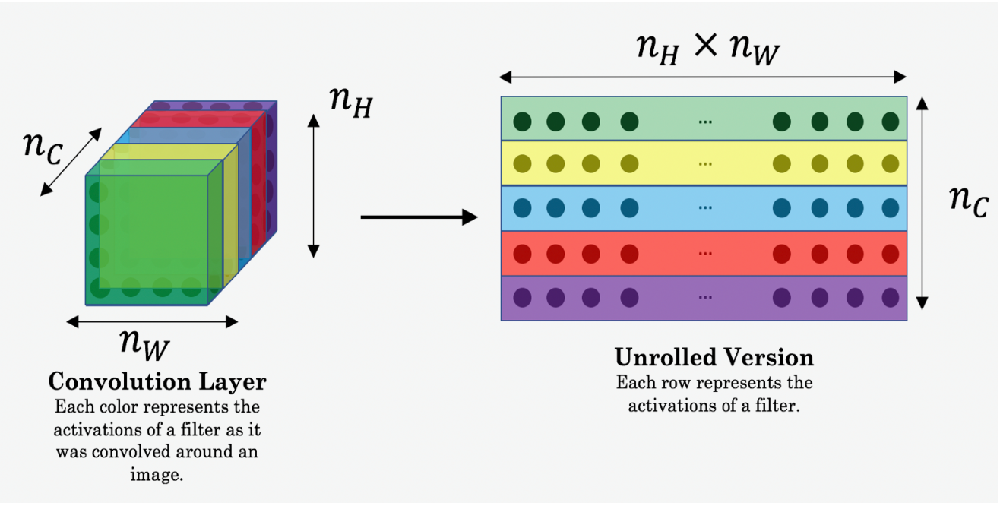

Okay here is before and after
Batch 0:


Before: <br>
Batch 0: [[[ 1,  2,  3], [ 4,  5,  6]],
          [[ 7,  8,  9], [10, 11, 12]]]

after <br>
Batch 0: [[ 1,  2,  3],
          [ 4,  5,  6],
          [ 7,  8,  9],
          [10, 11, 12]]

In [ ]:
def content_cost(content_activation, generated_activation):
  #as last activation is what we need for content cost
  a_C = content_activation[-1]
  a_G = generated_activation[-1]

  m,nH,nW,nC = a_G.shape.as_list()

  a_C_unroll = tf.reshape(a_C, [m,nH*nW,nC])
  a_C_unroll = tf.transpose(a_C_unroll,perm=[0,2,1])
  a_G_unroll = tf.reshape(a_G, [m,nH*nW,nC])
  a_G_unroll = tf.transpose(a_G_unroll,perm=[0,2,1])

  const = 1/(4*m*nH*nW*nC)
  content_cost = const * tf.reduce_sum(tf.square(tf.subtract(a_C_unroll,a_G_unroll)))
  return content_cost

In [ ]:
model.summary()

Model: "vgg19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv4 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 20,024,384 (76.39 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 20,024,384 (76.39 MB)

In [ ]:
style_layers=[
    ('block1_conv1',0.1),
    ('block2_conv1',0.2),
    ('block3_conv1',0.3),
    ('block4_conv1',0.2),
    ('block5_conv1',0.1)
]
content_layer=[('block5_conv2',0.5)]
layer_names= style_layers+content_layer
layer_names

[('block1_conv1', 0.1),
 ('block2_conv1', 0.2),
 ('block3_conv1', 0.3),
 ('block4_conv1', 0.2),
 ('block5_conv1', 0.1),
 ('block5_conv2', 0.5)]

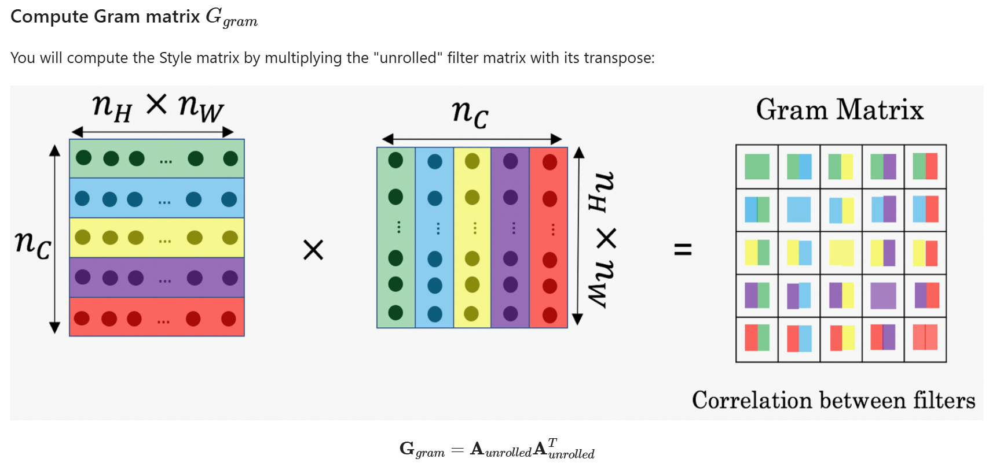

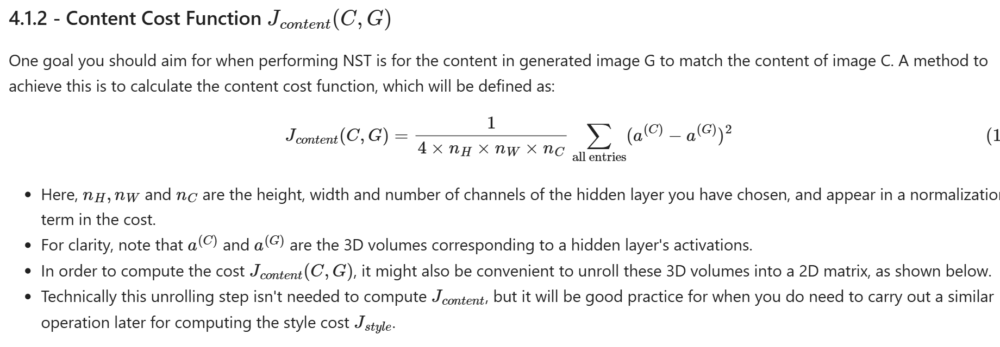

I faced so many crashes while computing style cost because of limited ram. The only image that i could work with was of the size 32x32x3

(It was because my unroll method was wrong)

In [ ]:
def compute_style_cost(activation_style,activation_generated,style_layers):
  total_cost=0
  #Excluding last layer from style and generated beucase it should only be used for content cost
  # I am looping here in order to get style cost funtion of different layers I have choosed
  for a_S,a_G,(_,weights) in zip(activation_style[:-1],activation_generated[:-1],style_layers[:-1]):
    m,nH,nW,nC = a_G.get_shape().as_list()
    a_S = tf.reshape(a_S,[m,-1,nC])
    a_S_unroll = tf.transpose(a_S,perm=[0,2,1])
    a_G = tf.reshape(a_G,[m,-1,nC])
    a_G_unroll = tf.transpose(a_G,perm=[0,2,1])

    #gram matrix (it tells us how simmiar they are to each other by substracting g_S from g_G)
    g_S = tf.matmul(a_S_unroll,a_S_unroll,transpose_b=True)
    g_G = tf.matmul(a_G_unroll,a_G_unroll,transpose_b=True)

    #cost of style image and generate image
    J_style_cost = (1/(4*m*nH*nW*nC) ) * tf.reduce_sum(tf.square(tf.subtract(g_S,g_G)))
    total_cost += weights * J_style_cost

  return total_cost



In [ ]:
style_layers[1]

('block2_conv1', 0.2)

In [ ]:
def get_model_layer(layer_names):
  outputlayer = [model.get_layer(name[0]).output for name in layer_names]
  new_model = tf.keras.Model([model.input],outputlayer)
  return new_model

In [ ]:
new_model = get_model_layer(layer_names)
new_model.summary()

Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv4 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv4 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 15,304,768 (58.38 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 15,304,768 (58.38 MB)

In [ ]:
def compute_total_cost(J_style_cost,J_content_cost,alpha=10,beta=4000):
  return alpha*J_content_cost + beta*J_style_cost

In [ ]:
generated_img = tf.Variable(content_img,dtype=tf.float32,trainable=True)
generated_img = tf.add(tf.random.uniform(tf.shape(generated_img),0,0.2),generated_img)
generated_img = tf.clip_by_value(generated_img,clip_value_min=0,clip_value_max=1)
generated_img = tf.Variable(generated_img)
generated_img.shape

TensorShape([1, 224, 224, 3])

In [ ]:
generated_img

<tf.Variable 'Variable:0' shape=(1, 224, 224, 3) dtype=float32, numpy=
array([[[[0.05882919, 0.0754531 , 0.05352622],
         [0.22494553, 0.2322933 , 0.06127303],
         [0.23061934, 0.12134708, 0.1950029 ],
         ...,
         [0.351139  , 0.32590362, 0.32805374],
         [0.5034444 , 0.3936699 , 0.14093626],
         [0.7071876 , 0.5809892 , 0.3265489 ]],

        [[0.22613594, 0.17821366, 0.09066758],
         [0.17547083, 0.10078377, 0.0565858 ],
         [0.19116807, 0.13882229, 0.07975605],
         ...,
         [0.4508065 , 0.27447727, 0.11638   ],
         [0.45009455, 0.3786474 , 0.24986961],
         [0.858897  , 0.70776767, 0.7038142 ]],

        [[0.35154188, 0.3222431 , 0.1357708 ],
         [0.3175308 , 0.15355554, 0.07105203],
         [0.32667232, 0.10266393, 0.06371716],
         ...,
         [0.5336983 , 0.45048207, 0.12045866],
         [0.58861554, 0.5592826 , 0.27099803],
         [0.8883979 , 0.94165033, 0.726639  ]],

        ...,

        [[0.5787957 ,

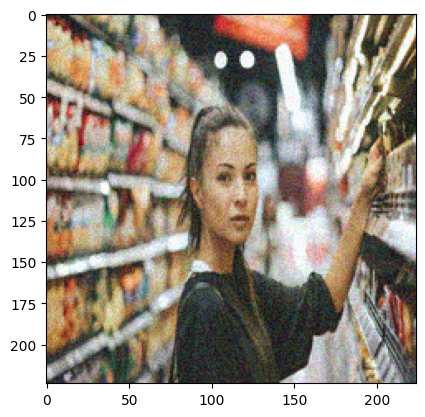

In [ ]:
plt.imshow(generated_img[0])

In [ ]:
content= new_model(content_img)
style = new_model(style_img)
generated = new_model(generated_img)

/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['keras_tensor_44']
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


In [ ]:
generated[-1].shape

TensorShape([1, 14, 14, 512])

In [ ]:
cost = content_cost(content,generated)
cost

<tf.Tensor: shape=(), dtype=float32, numpy=0.026142733171582222>

In [ ]:
cost_style = compute_style_cost(style,generated,style_layers)

In [ ]:
cost_style

<tf.Tensor: shape=(), dtype=float32, numpy=163113248.0>

In [ ]:
optimizer= tf.keras.optimizers.Adam(learning_rate=0.01)

In [ ]:
@tf.function
def train_step(generated_img, style_img=style_img, content_img=cat):
    with tf.GradientTape() as tape:
        # Extract features
        generated_output = new_model(generated_img)
        # Compute losses
        J_style = compute_style_cost(style_target, generated_output, style_layers)
        J_content = content_cost(content_target, generated_output)
        J_total = compute_total_cost(J_style, J_content)

    # Compute gradients
    grad = tape.gradient(J_total, generated_img)

    # Apply gradients to the generated image
    optimizer.apply_gradients([(grad, generated_img)])

    # Clip values to ensure image pixel range stays between 0 and 1
    generated_img.assign(tf.clip_by_value(generated_img, clip_value_min=0.0, clip_value_max=1.0))

    return J_total


In [ ]:
def tensor_to_uint8(tensored_img):
  img = tensored_img*255
  img = np.array(img,dtype=np.uint8)
  if np.ndim(img) > 3:
    img = img[0]
  return img

Right now the epoch is : 0


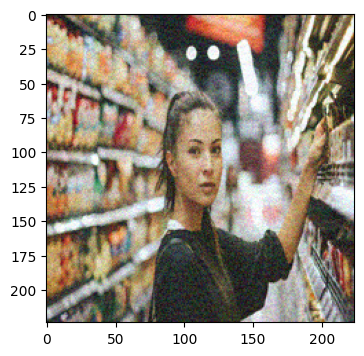

Right now the epoch is : 200


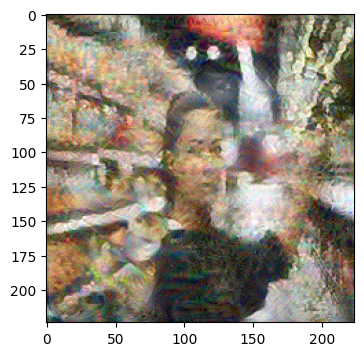

Right now the epoch is : 400


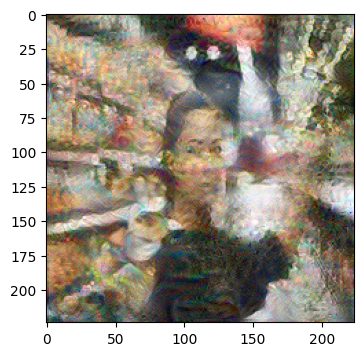

Right now the epoch is : 600


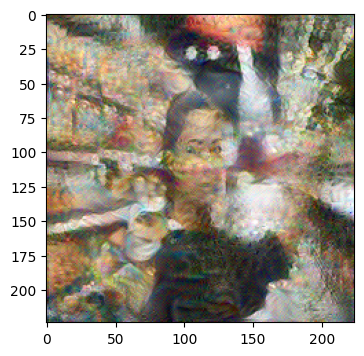

Right now the epoch is : 800


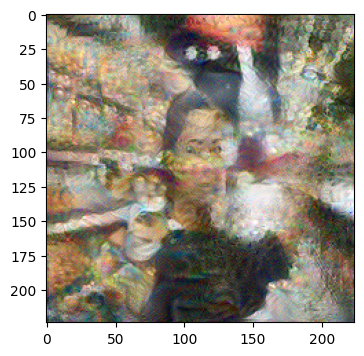

Right now the epoch is : 1000


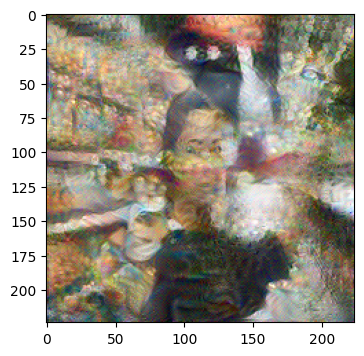

Right now the epoch is : 1200


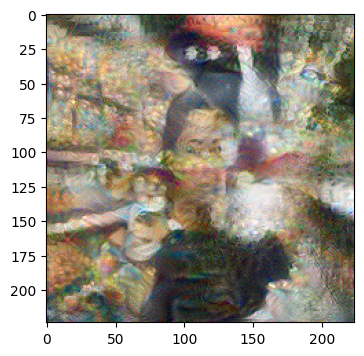

Right now the epoch is : 1400


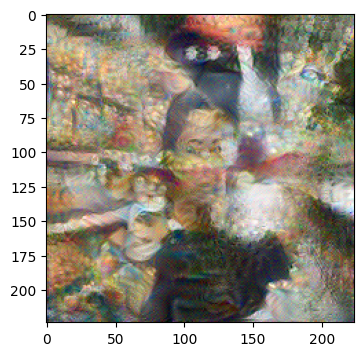

Right now the epoch is : 1600


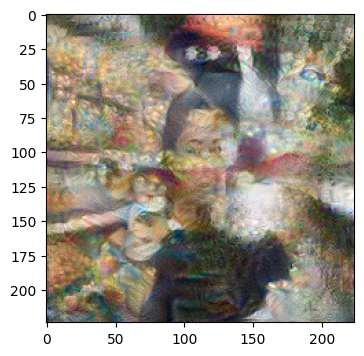

Right now the epoch is : 1800


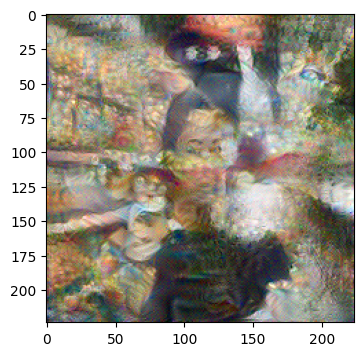

Right now the epoch is : 2000


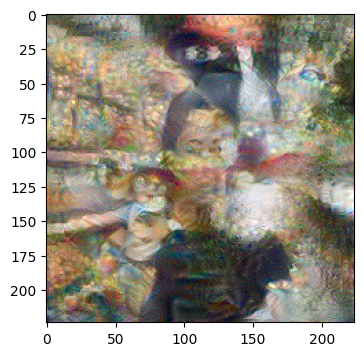

Right now the epoch is : 2200


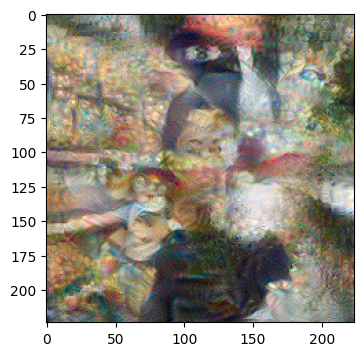

In [ ]:
#lets hope it works
epochs =2400
content_target = new_model(content_img)
style_target = new_model(style_img)
for i in range(epochs):
  train_step(generated_img)
  if i% 200 ==0:
    print(f'Right now the epoch is : {i}')
    img = tensor_to_uint8(generated_img)
    plt.figure(figsize=(4,4))
    plt.imshow(img)
    plt.show()

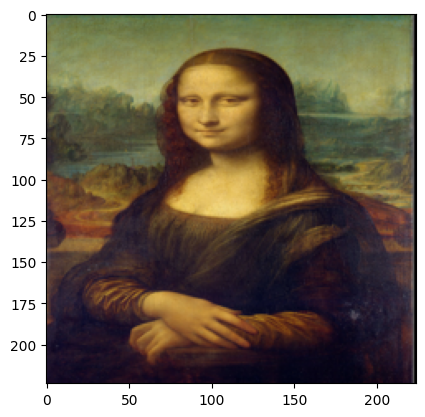

In [ ]:
plt.imshow(style_img[0])

-Lets make it more clean and reuseable

In [ ]:
def generate_img(content_img):
  generated = tf.Variable(content_img,dtype=tf.float32,trainable=True)
  generated = tf.add(tf.random.uniform(tf.shape(generated),0,0.2),generated)
  generated = tf.clip_by_value(generated,clip_value_min=0,clip_value_max=1)
  generated = tf.Variable(generated)
  return generated

In [ ]:
def preprocess_content(path,img_size=img_size):
  content_img = np.array(Image.open(path).resize((img_size,img_size)).convert('RGB'))
  content_img = tf.constant(np.reshape(content_img,(1,)+content_img.shape),dtype=tf.float32)
  content_img = content_img / 255.0
  return content_img

In [ ]:
def model_train(epoch,style_img,content_img, generated_img):
  for i in range(epoch):
    train_step(generated_img,style_img,content_img)
    if i% 200 ==0:
      print(f'Right now the epoch is : {i}')
      img = tensor_to_uint8(generated_img)
      plt.figure(figsize=(4,4))
      plt.imshow(img)
      plt.show()

In [ ]:
def model_pipeline(content_img_path,style_img_path, epochs,img_size=img_size):
  content_img = preprocess_content(content_img_path,img_size)
  style_img = preprocess_content(style_img_path,img_size)
  generated_img = generate_img(content_img)
  model_train(epoch,style_img,content_img,generated_img)


Right now the epoch is : 0


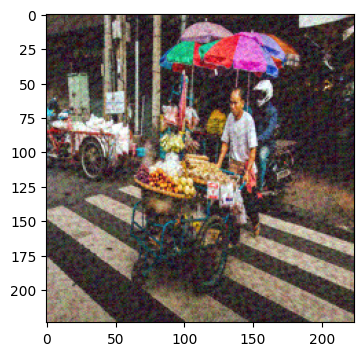

Right now the epoch is : 200


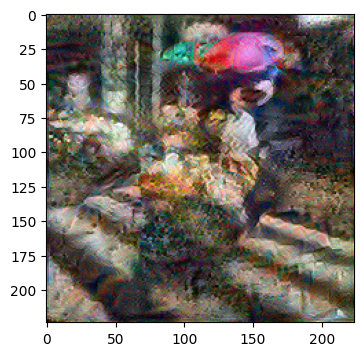

Right now the epoch is : 400


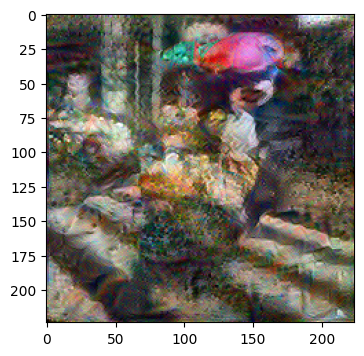

Right now the epoch is : 600


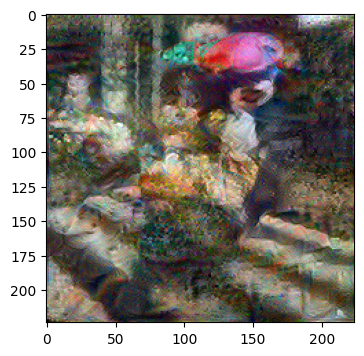

Right now the epoch is : 800


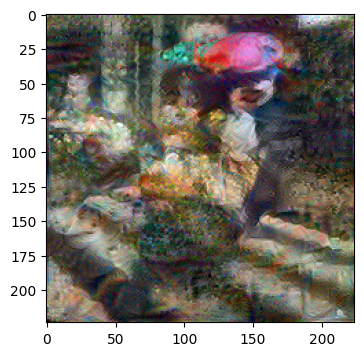

Right now the epoch is : 1000


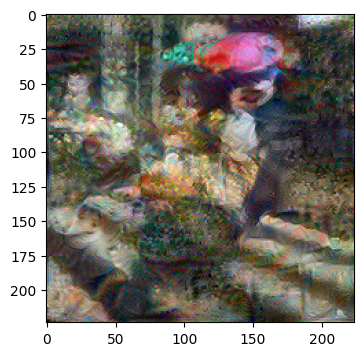

Right now the epoch is : 1200


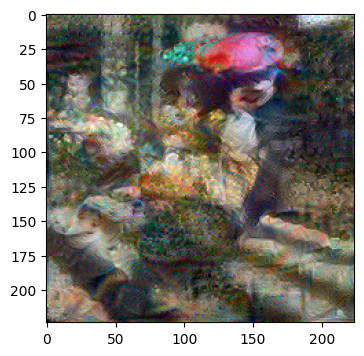

Right now the epoch is : 1400


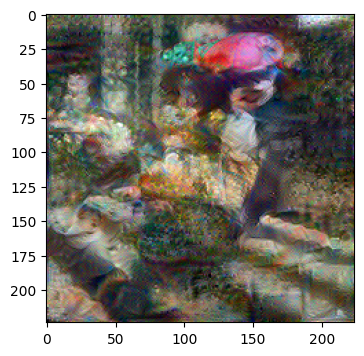

Right now the epoch is : 1600


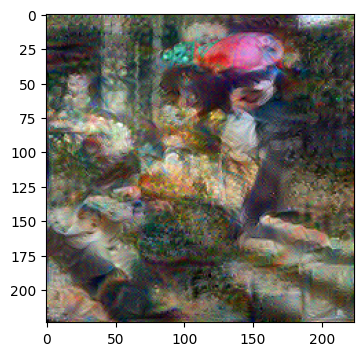

Right now the epoch is : 1800


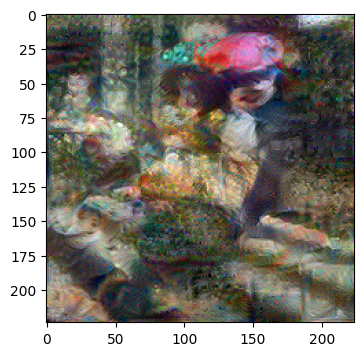

Right now the epoch is : 2000


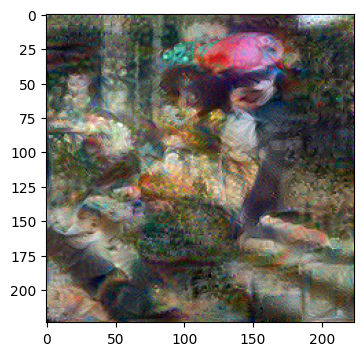

Right now the epoch is : 2200


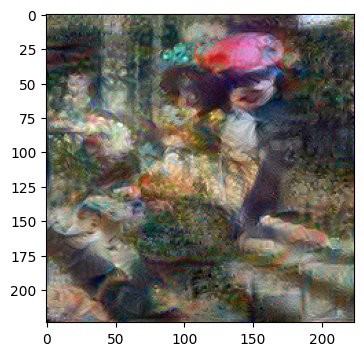

In [ ]:
content_path ='/content/evan-krause-p_owhk1VIl0-unsplash.jpg'
style_path = '/content/Screenshot 2025-05-14 095856.png'
epoch = 2400
model_pipeline(content_img_path=content_path,style_img_path=style_path,epochs=epoch)